<a href="https://colab.research.google.com/github/Steven2110/CelestialDistancePredict-Model/blob/main/DS_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Regression analysis for predicting Redshift in Galaxy
This is a university project for "Introduction to Data Science". In this project we are using regression analysis for predicting the redshift value of a galaxy. 
- Data Source: [Sload Digital Sky Survey DR 16](https://www.kaggle.com/datasets/muhakabartay/sloan-digital-sky-survey-dr16?resource=download)

# Import necessary libraries

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Read DataFrame from csv

In [4]:
df = pd.read_csv("/content/drive/MyDrive/DS_Project/Skyserver_12_30_2019 4_49_58 PM.csv")

In [5]:
df.head()

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,class,redshift,plate,mjd,fiberid
0,1237666301628060000,47.372545,0.820621,18.69254,17.13867,16.55555,16.34662,16.17639,4849,301,5,771,8168632633242440000,STAR,0.000115,7255,56597,832
1,1237673706652430000,116.303083,42.455980,18.47633,17.30546,17.24116,17.32780,17.37114,6573,301,6,220,9333948945297330000,STAR,-0.000093,8290,57364,868
2,1237671126974140000,172.756623,-8.785698,16.47714,15.31072,15.55971,15.72207,15.82471,5973,301,1,13,3221211255238850000,STAR,0.000165,2861,54583,42
3,1237665441518260000,201.224207,28.771290,18.63561,16.88346,16.09825,15.70987,15.43491,4649,301,3,121,2254061292459420000,GALAXY,0.058155,2002,53471,35
4,1237665441522840000,212.817222,26.625225,18.88325,17.87948,17.47037,17.17441,17.05235,4649,301,3,191,2390305906828010000,GALAXY,0.072210,2123,53793,74


In [6]:
df.shape

(100000, 18)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 18 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   objid      100000 non-null  int64  
 1   ra         100000 non-null  float64
 2   dec        100000 non-null  float64
 3   u          100000 non-null  float64
 4   g          100000 non-null  float64
 5   r          100000 non-null  float64
 6   i          100000 non-null  float64
 7   z          100000 non-null  float64
 8   run        100000 non-null  int64  
 9   rerun      100000 non-null  int64  
 10  camcol     100000 non-null  int64  
 11  field      100000 non-null  int64  
 12  specobjid  100000 non-null  uint64 
 13  class      100000 non-null  object 
 14  redshift   100000 non-null  float64
 15  plate      100000 non-null  int64  
 16  mjd        100000 non-null  int64  
 17  fiberid    100000 non-null  int64  
dtypes: float64(8), int64(8), object(1), uint64(1)
memory usage: 13.7+

1. 1 категориальный признак
2. 8 признаков являются непрерывным
3. 8 признаков являются целочисленным

In [8]:
df.describe().round(2)

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,redshift,plate,mjd,fiberid
count,1.000000e+05,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,100000.0,100000.00,100000.00,1.000000e+05,100000.00,100000.00,100000.00,100000.00
mean,1.237663e+18,177.51,25.05,18.64,17.41,16.88,16.63,16.47,3978.73,301.0,3.27,187.24,2.913905e+18,0.17,2587.98,53913.91,341.70
std,7.264931e+12,78.04,20.57,0.83,0.99,1.13,1.21,1.28,1691.50,0.0,1.62,141.04,2.488872e+18,0.44,2210.55,1547.24,217.07
min,1.237646e+18,0.01,-19.50,10.61,9.67,9.01,8.85,8.95,109.00,301.0,1.00,11.00,2.994897e+17,-0.00,266.00,51608.00,1.00
25%,1.237658e+18,136.36,6.77,18.21,16.85,16.20,15.87,15.62,2826.00,301.0,2.00,85.00,1.335426e+18,0.00,1186.00,52733.00,160.00
50%,1.237662e+18,180.41,23.92,18.87,17.52,16.89,16.60,16.43,3900.00,301.0,3.00,153.00,2.354330e+18,0.05,2091.00,53726.00,328.00
75%,1.237667e+18,224.37,40.34,19.27,18.06,17.59,17.34,17.23,5061.00,301.0,5.00,249.00,3.276384e+18,0.10,2910.00,54585.00,502.00
max,1.237681e+18,360.00,84.49,19.60,20.00,31.99,32.14,29.38,8162.00,301.0,6.00,982.00,1.317645e+19,7.01,11703.00,58543.00,1000.00


In [9]:
df.isna().sum()

objid        0
ra           0
dec          0
u            0
g            0
r            0
i            0
z            0
run          0
rerun        0
camcol       0
field        0
specobjid    0
class        0
redshift     0
plate        0
mjd          0
fiberid      0
dtype: int64

In [10]:
correlation = df.corr()
correlation.style.background_gradient(cmap='coolwarm')

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,redshift,plate,mjd,fiberid
objid,1.000000,-0.064351,-0.055489,0.010553,0.018754,0.020594,0.024751,0.027222,1.000000,nan,0.001595,-0.164873,0.366206,0.025678,0.366206,0.414232,0.095430
ra,-0.064351,1.000000,0.076869,0.020903,0.017404,0.012410,0.006191,0.001267,-0.064350,nan,-0.007632,0.021964,-0.056831,-0.006616,-0.056830,-0.030444,-0.027535
dec,-0.055489,0.076869,1.000000,-0.027315,-0.013263,-0.004657,-0.001074,0.004785,-0.055499,nan,0.081407,-0.113244,0.017817,0.011340,0.017817,0.026241,0.029428
u,0.010553,0.020903,-0.027315,1.000000,0.843252,0.692903,0.615987,0.562021,0.010552,nan,0.006705,0.012013,0.008705,0.172663,0.008705,-0.011243,0.017322
g,0.018754,0.017404,-0.013263,0.843252,1.000000,0.956717,0.915003,0.886663,0.018753,nan,0.011895,0.007629,0.147623,0.422311,0.147622,0.114511,0.068937
r,0.020594,0.012410,-0.004657,0.692903,0.956717,1.000000,0.976051,0.961456,0.020593,nan,0.013450,0.002214,0.203246,0.453376,0.203246,0.171312,0.085876
i,0.024751,0.006191,-0.001074,0.615987,0.915003,0.976051,1.000000,0.977189,0.024749,nan,0.015305,-0.001310,0.236314,0.449680,0.236314,0.207153,0.093089
z,0.027222,0.001267,0.004785,0.562021,0.886663,0.961456,0.977189,1.000000,0.027220,nan,0.013702,-0.003809,0.251838,0.440964,0.251837,0.226435,0.096774
run,1.000000,-0.064350,-0.055499,0.010552,0.018753,0.020593,0.024749,0.027220,1.000000,nan,0.001476,-0.164865,0.366204,0.025678,0.366205,0.414230,0.095397
rerun,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


## Pandas profiling для создания отчёта

In [11]:
!pip install pandas-profiling

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 352.3/352.3 kB 32.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 9.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 30.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.4/455.4 kB 28.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 16.1 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=34ac59d29c03e238a22c41d43ceb0b3aa046810b4d39624c205aa064274af227
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attemp

In [12]:
from pandas_profiling import ProfileReport

In [13]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Divide data taking only Galaxy

In [11]:
df['class'].unique()

array(['STAR', 'GALAXY', 'QSO'], dtype=object)

In [65]:
galaxy_df = df[df['class']=='GALAXY']
galaxy_df.head()

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,class,redshift,plate,mjd,fiberid
3,1237665441518260000,201.224207,28.771290,18.63561,16.88346,16.09825,15.70987,15.43491,4649,301,3,121,2254061292459420000,GALAXY,0.058155,2002,53471,35
4,1237665441522840000,212.817222,26.625225,18.88325,17.87948,17.47037,17.17441,17.05235,4649,301,3,191,2390305906828010000,GALAXY,0.072210,2123,53793,74
5,1237668294987420000,178.334659,20.751715,15.44680,13.88656,13.06969,12.68676,12.42432,5313,301,6,125,2831738116518210000,GALAXY,0.020701,2515,54180,363
6,1237668294985060000,172.597478,20.552722,19.10002,17.10998,16.05751,15.63390,15.26723,5313,301,6,89,2812665437882440000,GALAXY,0.130948,2498,54169,609
7,1237668294984930000,172.309005,20.581135,16.89111,16.29741,16.25994,16.86333,16.77033,5313,301,6,87,2814772926945980000,GALAXY,0.004703,2500,54178,84


In [76]:
galaxy_df.shape

(51323, 18)

### Remove all data with negative redshift value since we don't want to check for this data

In [75]:
galaxy_df[galaxy_df['redshift'] < 0].shape

(17, 18)

In [77]:
galaxy_df.drop(galaxy_df[galaxy_df['redshift'] < 0].index, inplace = True)

In [78]:
galaxy_df.shape

(51306, 18)

# Creating model for Galaxy

## Divide data into features and target

In [79]:
galaxy_target = galaxy_df['redshift']
galaxy_target

3        0.058155
4        0.072210
5        0.020701
6        0.130948
7        0.004703
           ...   
99988    0.046924
99991    0.079500
99994    0.076411
99997    0.004587
99998    0.084538
Name: redshift, Length: 51306, dtype: float64

In [80]:
galaxy_features = pd.DataFrame()
# We need to divide all the flux magnitude into 4 separate color from these magnitudes:
#  - Color u-g: u magnitude - g magnitude
#  - Color g-r: g magnitude - r magnitude
#  - Color r-i: r magnitude - i magnitude
#  - Color i-z: i magnitude - z magnitude
galaxy_features["ug"] = galaxy_df["u"] - galaxy_df["g"]
galaxy_features["gr"] = galaxy_df["g"] - galaxy_df["r"]
galaxy_features["ri"] = galaxy_df["r"] - galaxy_df["i"]
galaxy_features["iz"] = galaxy_df["i"] - galaxy_df["z"]
galaxy_features.head()

,ug,gr,ri,iz
3,1.75215,0.78521,0.38838,0.27496
4,1.00377,0.40911,0.29596,0.12206
5,1.56024,0.81687,0.38293,0.26244
6,1.99004,1.05247,0.42361,0.36667
7,0.59370,0.03747,-0.60339,0.09300


### Checking for outliers

#### Redshift/target

In [81]:
galaxy_target.describe()

count    51306.000000
mean         0.078118
std          0.048625
min          0.000000
25%          0.047966
50%          0.073281
75%          0.100840
max          1.945427
Name: redshift, dtype: float64

Text(0.5, 0, 'redshift')

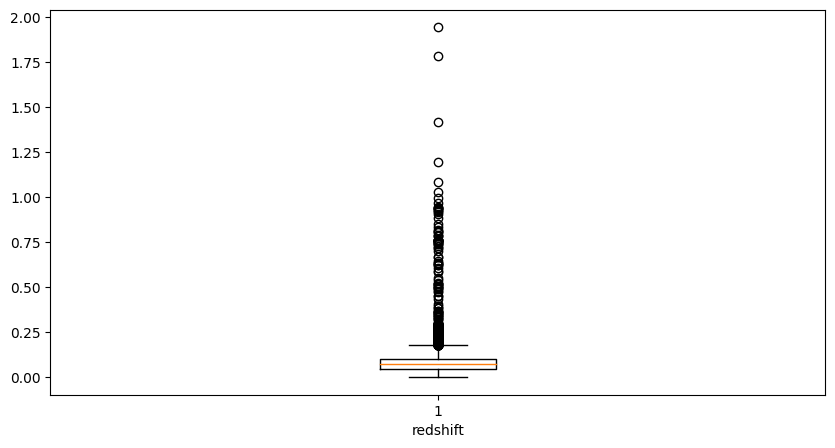

In [82]:
plt.figure(figsize=(10, 5))

plt.boxplot(galaxy_target)
plt.xlabel("redshift")

In [90]:
galaxy_target[galaxy_target >= 0.101]

6        0.130948
12       0.135173
19       0.122238
31       0.105162
37       0.111841
           ...   
99940    0.105635
99958    0.137128
99969    0.122363
99981    0.142380
99984    0.112826
Name: redshift, Length: 12777, dtype: float64

There are many outliers for redshift value, we can either remove it or change it with IQR threshold (interquartiles range). Here we will change it with IQR threshold since there are almost 25% data contains outlier value. 12,777/51,306 outliers

In [92]:
def np_get_iqr_threshold(data):
  q1 = np.quantile(data, 0.25)
  q3 = np.quantile(data, 0.75)
  iqr = q3 - q1
  lower_limit = q1 - 1.5 * iqr
  upper_limit = q3 + 1.5 * iqr
  return lower_limit, upper_limit

In [94]:
lower_limit, upper_limit = np_get_iqr_threshold(galaxy_target)
galaxy_target[galaxy_target < lower_limit] = lower_limit
galaxy_target[galaxy_target > upper_limit] = upper_limit

galaxy_target.describe()

count    51306.000000
mean         0.076849
std          0.038575
min          0.000000
25%          0.047966
50%          0.073281
75%          0.100840
max          0.180151
Name: redshift, dtype: float64

#### Magnitudes/Features

In [95]:
galaxy_features.describe()

,ug,gr,ri,iz
count,51306.000000,51306.000000,51306.000000,51306.000000
mean,1.455590,0.692259,0.368458,0.249673
std,0.369516,0.265088,0.218640,0.262456
min,-3.984730,-14.784580,-15.859360,-13.162490
25%,1.175592,0.528272,0.326233,0.188060
50%,1.412235,0.715205,0.390205,0.269490
75%,1.786537,0.873777,0.430348,0.325060
max,4.073900,2.905300,10.730430,16.548340


Text(0.5, 0, "['ug', 'gr', 'ri', 'iz']")

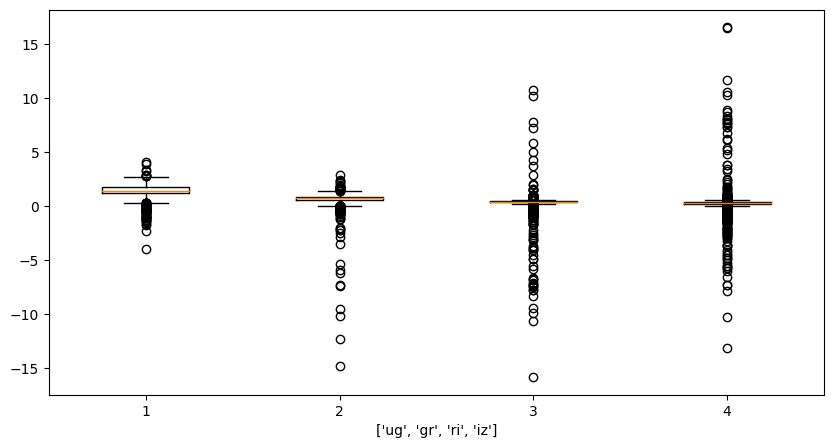

In [96]:
plt.figure(figsize=(10, 5))

plt.boxplot(galaxy_features)
plt.xlabel(["ug", "gr", "ri", "iz"])

In [69]:
galaxy_features[galaxy_features['ri'] > 0.431].shape

(12661, 4)

In [70]:
galaxy_features[galaxy_features['iz'] > 10.731].shape

(3, 4)

There are many outliers for ug, gr, ri, iz value, we can either remove it or change it with IQR threshold (interquartiles range). Here we will change it with IQR threshold since in some data there are more than 50% data contains outlier value.

In [97]:
def get_iqr_threshold(df, col_name):
  q1 = df[col_name].quantile(0.25)
  q3 = df[col_name].quantile(0.75)
  iqr = q3 - q1
  upper_limit = q3 + 1.5 * iqr
  lower_limit = q1 - 1.5 * iqr
  return lower_limit, upper_limit

In [98]:
ug_lower_limit, ug_upper_limit = get_iqr_threshold(galaxy_features, 'ug')
galaxy_features['ug'].mask(galaxy_features['ug'] > ug_upper_limit, ug_upper_limit, inplace=True)
galaxy_features['ug'].mask(galaxy_features['ug'] < ug_lower_limit, ug_lower_limit, inplace=True)

In [99]:
gr_lower_limit, gr_upper_limit = get_iqr_threshold(galaxy_features, 'gr')
galaxy_features['gr'].mask(galaxy_features['gr'] > gr_upper_limit, gr_upper_limit, inplace=True)
galaxy_features['gr'].mask(galaxy_features['gr'] < gr_lower_limit, gr_lower_limit, inplace=True)

In [100]:
ri_lower_limit, ri_upper_limit = get_iqr_threshold(galaxy_features, 'ri')
galaxy_features['ri'].mask(galaxy_features['ri'] > ri_upper_limit, ri_upper_limit, inplace=True)
galaxy_features['ri'].mask(galaxy_features['ri'] < ri_lower_limit, ri_lower_limit, inplace=True)

In [101]:
iz_lower_limit, iz_upper_limit = get_iqr_threshold(galaxy_features, 'iz')
galaxy_features['iz'].mask(galaxy_features['iz'] > iz_lower_limit, iz_lower_limit, inplace=True)
galaxy_features['iz'].mask(galaxy_features['iz'] < iz_upper_limit, iz_upper_limit, inplace=True)

In [102]:
galaxy_features.describe()

,ug,gr,ri,iz
count,51306.000000,51306.000000,51306.000000,51306.00000
mean,1.456671,0.694832,0.373871,0.53056
std,0.363311,0.222916,0.082144,0.00000
min,0.259175,0.010015,0.170060,0.53056
25%,1.175592,0.528272,0.326233,0.53056
50%,1.412235,0.715205,0.390205,0.53056
75%,1.786537,0.873777,0.430348,0.53056
max,2.702955,1.392035,0.586520,0.53056


Text(0.5, 0, "['ug', 'gr', 'ri', 'iz']")

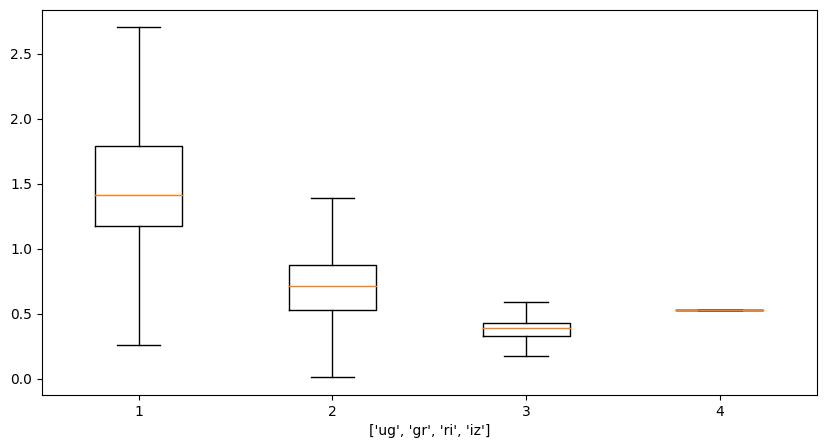

In [103]:
plt.figure(figsize=(10, 5))

plt.boxplot(galaxy_df_features)
plt.xlabel(["ug", "gr", "ri", "iz"])

## Подключение библиотек scikit sklearn

In [104]:
!pip install -U sklearn-rvm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [105]:
from numpy import mean
from numpy import std

from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn_rvm import EMRVR
from sklearn.svm import SVR

from sklearn.metrics import roc_auc_score, mean_squared_error, mean_absolute_error, explained_variance_score, r2_score, median_absolute_error
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import cross_val_score

## Divide features and target data into train and test data

In [106]:
X_train, X_test, y_train, y_test = train_test_split(galaxy_features, galaxy_target, test_size=0.35)
X_train, X_val, y_train, y_val= train_test_split(X_train, y_train, test_size= 0.25) 

## Feature selection

In [107]:
# Feature selection by ExtraTreesRegressor(model based)

from sklearn.ensemble import ExtraTreesRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score as acc

In [108]:
reg= ExtraTreesRegressor()

In [109]:
reg.fit(X_train,y_train)

# Let us print the features importance.
reg.feature_importances_

array([0.35165392, 0.33577843, 0.31256765, 0.        ])

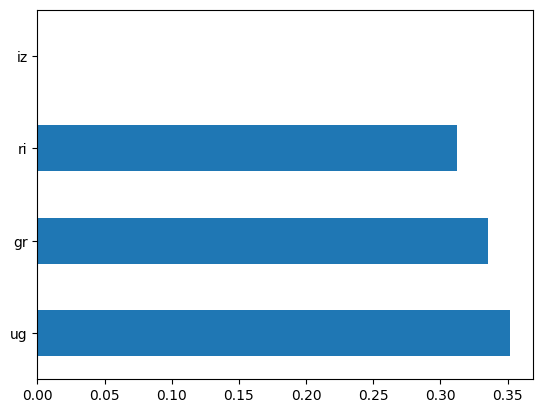

In [110]:
feat_importances = pd.Series(reg.feature_importances_, index=X_train.columns)
feat_importances.nlargest(5).plot(kind='barh')
plt.show()

## Training DecisionTreeRegressor model

In [111]:
dtr = DecisionTreeRegressor()

In [112]:
dtr.fit(X_train, y_train)

score = dtr.score(X_train, y_train)

# Prediction on the training dataset
y_train_pred = dtr.predict(X_train)

mse = mean_squared_error(y_train, y_train_pred)
mae = mean_absolute_error(y_train, y_train_pred)
evs = explained_variance_score(y_train, y_train_pred)
meae = median_absolute_error(y_train, y_train_pred)

print(f"R-squared: {score}")
print(f"Mean Absolute Error: {mae.round(2)}")
print(f"Mean Squared Error: {mse.round(2)}")
print(f"RMSE: {np.square(mse).round(2)}")
print(f"EVS: {evs.round(2)}")
print(f"Median Absolute Error: {meae.round(2)}")

R-squared: 0.9967973893585357
Mean Absolute Error: 0.0
Mean Squared Error: 0.0
RMSE: 0.0
EVS: 1.0
Median Absolute Error: 0.0


## Evaluation
For mean squared error we need to get value closer to 0
For median squared error we need to get value closer to 0

In [113]:
y_val_pred = dtr.predict(X_val)

rScore = r2_score(y_val, y_val_pred)
mse = mean_squared_error(y_val, y_val_pred)
mae = mean_absolute_error(y_val, y_val_pred)
evs = explained_variance_score(y_val, y_val_pred)
meae = median_absolute_error(y_val, y_val_pred)

print(f"R-squared: {rScore}")
print(f"Mean Absolute Error: {mae.round(2)}")
print(f"Mean Squared Error: {mse.round(2)}")
print(f"RMSE: {np.square(mse).round(2)}")
print(f"EVS: {evs.round(2)}")
print(f"Median Absolute Error: {meae.round(4)}")

R-squared: 0.16398111660929393
Mean Absolute Error: 0.03
Mean Squared Error: 0.0
RMSE: 0.0
EVS: 0.16
Median Absolute Error: 0.0185


In [114]:
y_pred = dtr.predict(X_test)

rScore = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
evs = explained_variance_score(y_test, y_pred)
meae = median_absolute_error(y_test, y_pred)

print(f"R-squared: {rScore}")
print(f"Mean Absolute Error: {mae.round(2)}")
print(f"Mean Squared Error: {mse.round(2)}")
print(f"RMSE: {np.square(mse).round(2)}")
print(f"EVS: {evs.round(2)}")
print(f"Median Absolute Error: {meae.round(4)}")

R-squared: 0.17400644320590852
Mean Absolute Error: 0.03
Mean Squared Error: 0.0
RMSE: 0.0
EVS: 0.17
Median Absolute Error: 0.0186


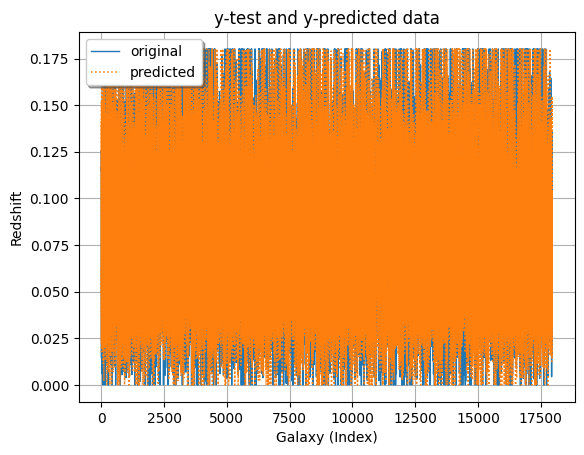

In [115]:
x_ax = range(len(y_test))
fig = plt.figure()
plt.plot(x_ax, y_test, linewidth=1, label="original", linestyle='-')
plt.plot(x_ax, y_pred, linewidth=1.1, label="predicted", linestyle=':')
plt.title("y-test and y-predicted data")
plt.xlabel('Galaxy (Index)')
plt.ylabel('Redshift')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
# plt

In [116]:
print(f"Min redshift: {galaxy_df['redshift'].min()}, max redshift: {galaxy_df['redshift'].max()}")

Min redshift: 0.0, max redshift: 0.1801506975


In [117]:
data = y_test-y_pred

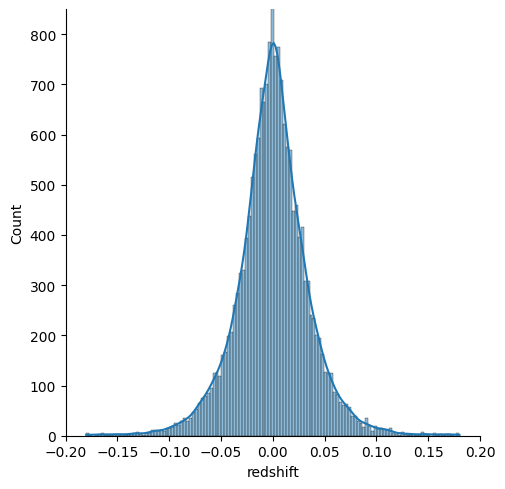

In [119]:
# checking difference between labled y and predicted y
g = sns.displot(data, kind='hist', kde=True)
g.set(ylim=(0, 850), xlim=(-0.2, 0.2))

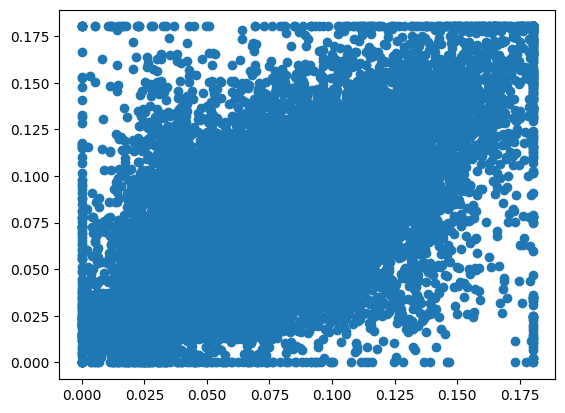

In [120]:
plt.scatter(y_test,y_pred)

## Find best fit DTR hyperparameter

### Tree depth

In [121]:
def accuracy_by_treedepth(train_features, train_targets, val_features, val_targets, test_features, test_targets, depths): 
  # initialise arrays or lists to store the accuracies for the below loop
  train_accuracy = []
  val_accuracy = []
  test_accuracy = []

  # loop through depths
  for depth in depths:
    # initialize model with the maximum depth. 
    dtr = DecisionTreeRegressor(max_depth=depth)

    # train the model using the training set
    dtr.fit(train_features, train_targets)

    # get the predictions for the training set and calculate their median_diff
    train_predictions = dtr.predict(train_features)
    median_diff_train = median_absolute_error(train_targets, train_predictions)
    train_accuracy.append(median_diff_train)

    # get the predictions for the training set and calculate their median_diff
    val_predictions = dtr.predict(val_features)
    median_diff_val = median_absolute_error(val_targets, val_predictions)
    val_accuracy.append(median_diff_val)

    # get the predictions for the testing set and calculate their median_diff
    predictions = dtr.predict(test_features)
    median_diff_test = median_absolute_error(test_targets, predictions)
    test_accuracy.append(median_diff_test)
        
  # return the accuracies for the training and testing sets
  return train_accuracy, val_accuracy, test_accuracy

In [126]:
tree_depths = [i for i in range(1, 36)]
train_med_diffs, val_med_diffs, test_med_diffs = accuracy_by_treedepth(X_train, y_train, X_val, y_val, X_test, y_test, tree_depths)
print("Training: Depth with lowest median difference : {}".format(tree_depths[train_med_diffs.index(min(train_med_diffs))]))
print("Validation: Depth with lowest median difference : {}".format(tree_depths[val_med_diffs.index(min(val_med_diffs))]))
print("Test: Depth with lowest median difference : {}".format(tree_depths[test_med_diffs.index(min(test_med_diffs))]))

Training: Depth with lowest median difference : 20
Validation: Depth with lowest median difference : 11
Test: Depth with lowest median difference : 10


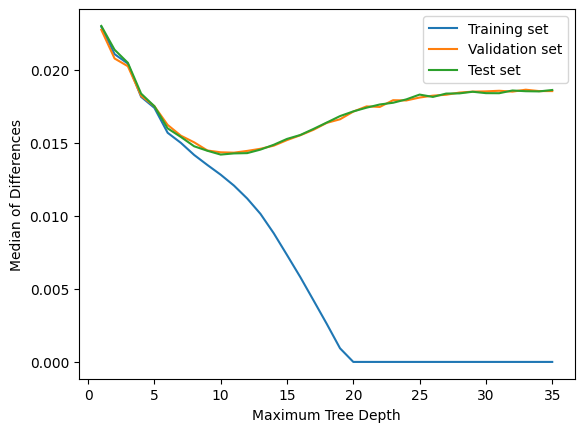

In [127]:
# Plot the results
train_plot = plt.plot(tree_depths, train_med_diffs, label='Training set')
val_plot = plt.plot(tree_depths, val_med_diffs, label='Validation set')
test_plot = plt.plot(tree_depths, test_med_diffs, label='Test set')
plt.xlabel("Maximum Tree Depth")
plt.ylabel("Median of Differences")
plt.legend()
plt.show()

#### Depth best parameter

In [128]:
DEPTH = 10

### Min sample split

In [129]:
def accuracy_by_min_sample_split(train_features, train_targets, val_features, val_targets, test_features, test_targets, splits): 
  # initialise arrays or lists to store the accuracies for the below loop
  train_accuracy = []
  val_accuracy = []
  test_accuracy = []

  # loop through depths
  for split in splits:
    # initialize model with the maximum depth. 
    dtr = DecisionTreeRegressor(max_depth=DEPTH, min_samples_split=split)

    # train the model using the training set
    dtr.fit(train_features, train_targets)

    # get the predictions for the training set and calculate their median_diff
    train_predictions = dtr.predict(train_features)
    median_diff_train = median_absolute_error(train_targets, train_predictions)
    train_accuracy.append(median_diff_train)

    # get the predictions for the training set and calculate their median_diff
    val_predictions = dtr.predict(val_features)
    median_diff_val = median_absolute_error(val_targets, val_predictions)
    val_accuracy.append(median_diff_val)

    # get the predictions for the testing set and calculate their median_diff
    predictions = dtr.predict(test_features)
    median_diff_test = median_absolute_error(test_targets, predictions)
    test_accuracy.append(median_diff_test)
        
  # return the accuracies for the training and testing sets
  return train_accuracy, val_accuracy, test_accuracy

In [130]:
splits = [i for i in range(2, 30)]
train_med_diffs, val_med_diffs, test_med_diffs = accuracy_by_min_sample_split(X_train, y_train, X_val, y_val, X_test, y_test, splits)
print("Training: Min sample split with lowest median difference : {}".format(splits[train_med_diffs.index(min(train_med_diffs))]))
print("Validation: Min sample split with lowest median difference : {}".format(splits[val_med_diffs.index(min(val_med_diffs))]))
print("Test: Min sample split with lowest median difference : {}".format(splits[test_med_diffs.index(min(test_med_diffs))]))

Training: Min sample split with lowest median difference : 2
Validation: Min sample split with lowest median difference : 3
Test: Min sample split with lowest median difference : 4


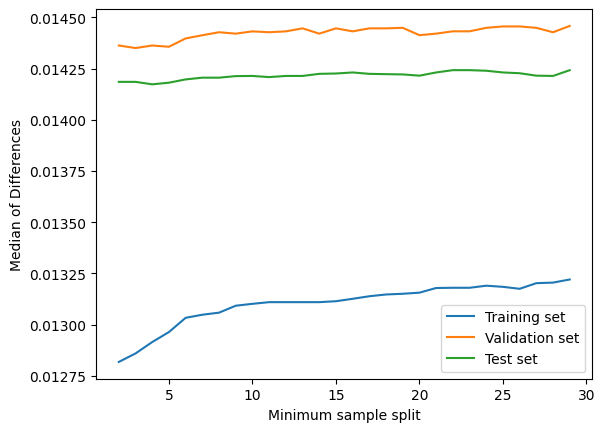

In [131]:
# Plot the results
train_plot = plt.plot(splits, train_med_diffs, label='Training set')
val_plot = plt.plot(splits, val_med_diffs, label='Validation set')
test_plot = plt.plot(splits, test_med_diffs, label='Test set')
plt.xlabel("Minimum sample split")
plt.ylabel("Median of Differences")
plt.legend()
plt.show()

#### Min sample split best param

In [132]:
SAMPLE_SPLIT = 4

### Min leaf weight fraction

In [136]:
def accuracy_by_min_leaf_weight(train_features, train_targets, val_features, val_targets, test_features, test_targets, weights): 
  # initialise arrays or lists to store the accuracies for the below loop
  train_accuracy = []
  val_accuracy = []
  test_accuracy = []

  # loop through depths
  for weight in weights:
    # initialize model with the maximum depth. 
    dtr = DecisionTreeRegressor(max_depth=DEPTH, min_samples_split=SAMPLE_SPLIT, min_weight_fraction_leaf=weight)

    # train the model using the training set
    dtr.fit(train_features, train_targets)

    # get the predictions for the training set and calculate their median_diff
    train_predictions = dtr.predict(train_features)
    median_diff_train = median_absolute_error(train_targets, train_predictions)
    train_accuracy.append(median_diff_train)

    # get the predictions for the training set and calculate their median_diff
    val_predictions = dtr.predict(val_features)
    median_diff_val = median_absolute_error(val_targets, val_predictions)
    val_accuracy.append(median_diff_val)

    # get the predictions for the testing set and calculate their median_diff
    predictions = dtr.predict(test_features)
    median_diff_test = median_absolute_error(test_targets, predictions)
    test_accuracy.append(median_diff_test)
        
  # return the accuracies for the training and testing sets
  return train_accuracy, val_accuracy, test_accuracy

In [140]:
min_weight_leaf = [i * 0.1 for i in range(1, 11)]
train_med_diffs, val_med_diffs, test_med_diffs = accuracy_by_min_sample_split(X_train, y_train, X_val, y_val, X_test, y_test, min_weight_leaf)
print("Training: Min weight fraction leaf with lowest median difference : {}".format(min_weight_leaf[train_med_diffs.index(min(train_med_diffs))]))
print("Validation: Min weight fraction leaf with lowest median difference : {}".format(min_weight_leaf[val_med_diffs.index(min(val_med_diffs))]))
print("Test: Min weight fraction leaf with lowest median difference : {}".format(min_weight_leaf[test_med_diffs.index(min(test_med_diffs))]))

Training: Min weight fraction leaf with lowest median difference : 0.1
Validation: Min weight fraction leaf with lowest median difference : 0.1
Test: Min weight fraction leaf with lowest median difference : 0.1


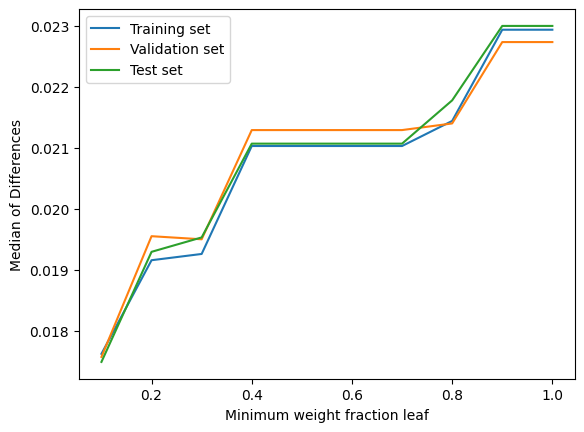

In [141]:
# Plot the results
train_plot = plt.plot(min_weight_leaf, train_med_diffs, label='Training set')
val_plot = plt.plot(min_weight_leaf, val_med_diffs, label='Validation set')
test_plot = plt.plot(min_weight_leaf, test_med_diffs, label='Test set')
plt.xlabel("Minimum weight fraction leaf")
plt.ylabel("Median of Differences")
plt.legend()
plt.show()

#### Min Weight leaf best parameter

In [142]:
LEAF_WEIGHT = 0.1

### Min samples leaf

In [143]:
def accuracy_by_min_leaf_samples(train_features, train_targets, val_features, val_targets, test_features, test_targets, leaf_samples): 
  # initialise arrays or lists to store the accuracies for the below loop
  train_accuracy = []
  val_accuracy = []
  test_accuracy = []

  # loop through depths
  for leaf_sample in leaf_samples:
    # initialize model with the maximum depth. 
    dtr = DecisionTreeRegressor(max_depth=DEPTH, min_samples_split=SAMPLE_SPLIT, min_weight_fraction_leaf=LEAF_WEIGHT, min_samples_leaf=leaf_sample)

    # train the model using the training set
    dtr.fit(train_features, train_targets)

    # get the predictions for the training set and calculate their median_diff
    train_predictions = dtr.predict(train_features)
    median_diff_train = median_absolute_error(train_targets, train_predictions)
    train_accuracy.append(median_diff_train)

    # get the predictions for the training set and calculate their median_diff
    val_predictions = dtr.predict(val_features)
    median_diff_val = median_absolute_error(val_targets, val_predictions)
    val_accuracy.append(median_diff_val)

    # get the predictions for the testing set and calculate their median_diff
    predictions = dtr.predict(test_features)
    median_diff_test = median_absolute_error(test_targets, predictions)
    test_accuracy.append(median_diff_test)
        
  # return the accuracies for the training and testing sets
  return train_accuracy, val_accuracy, test_accuracy

In [144]:
min_samples_leaf = [i for i in range(1, 30)]
train_med_diffs, val_med_diffs, test_med_diffs = accuracy_by_min_leaf_samples(X_train, y_train, X_val, y_val, X_test, y_test, min_samples_leaf)
print("Training: Min samples leaf with lowest median difference : {}".format(min_samples_leaf[train_med_diffs.index(min(train_med_diffs))]))
print("Validation: Min samples leaf with lowest median difference : {}".format(min_samples_leaf[val_med_diffs.index(min(val_med_diffs))]))
print("Test: Min samples leaf with lowest median difference : {}".format(min_samples_leaf[test_med_diffs.index(min(test_med_diffs))]))

Training: Min samples leaf with lowest median difference : 1
Validation: Min samples leaf with lowest median difference : 5
Test: Min samples leaf with lowest median difference : 1


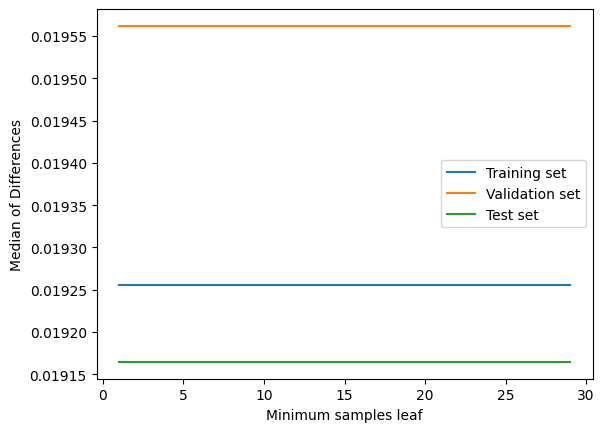

In [145]:
# Plot the results
train_plot = plt.plot(min_samples_leaf, train_med_diffs, label='Training set')
val_plot = plt.plot(min_samples_leaf, val_med_diffs, label='Validation set')
test_plot = plt.plot(min_samples_leaf, test_med_diffs, label='Test set')
plt.xlabel("Minimum samples leaf")
plt.ylabel("Median of Differences")
plt.legend()
plt.show()

#### Min samples leaf best parameter

In [146]:
LEAF_SAMPLE = 1

### Max features

In [147]:
def accuracy_by_max_features(train_features, train_targets, val_features, val_targets, test_features, test_targets, max_features): 
  # initialise arrays or lists to store the accuracies for the below loop
  train_accuracy = []
  val_accuracy = []
  test_accuracy = []

  # loop through depths
  for feature in max_features:
    # initialize model with the maximum depth. 
    dtr = DecisionTreeRegressor(max_depth=DEPTH, min_samples_split=SAMPLE_SPLIT, min_weight_fraction_leaf=LEAF_WEIGHT, min_samples_leaf=LEAF_SAMPLE, max_features=feature)

    # train the model using the training set
    dtr.fit(train_features, train_targets)

    # get the predictions for the training set and calculate their median_diff
    train_predictions = dtr.predict(train_features)
    median_diff_train = median_absolute_error(train_targets, train_predictions)
    train_accuracy.append(median_diff_train)

    # get the predictions for the training set and calculate their median_diff
    val_predictions = dtr.predict(val_features)
    median_diff_val = median_absolute_error(val_targets, val_predictions)
    val_accuracy.append(median_diff_val)

    # get the predictions for the testing set and calculate their median_diff
    predictions = dtr.predict(test_features)
    median_diff_test = median_absolute_error(test_targets, predictions)
    test_accuracy.append(median_diff_test)
        
  # return the accuracies for the training and testing sets
  return train_accuracy, val_accuracy, test_accuracy

In [148]:
max_features = ["auto", "sqrt", "log2"]
train_med_diffs, val_med_diffs, test_med_diffs = accuracy_by_max_features(X_train, y_train, X_val, y_val, X_test, y_test, max_features)
print("Training: Max features with lowest median difference : {}".format(max_features[train_med_diffs.index(min(train_med_diffs))]))
print("Validation: Max features with lowest median difference : {}".format(max_features[val_med_diffs.index(min(val_med_diffs))]))
print("Test: Max features with lowest median difference : {}".format(max_features[test_med_diffs.index(min(test_med_diffs))]))

Training: Max features with lowest median difference : auto
Validation: Max features with lowest median difference : auto
Test: Max features with lowest median difference : auto


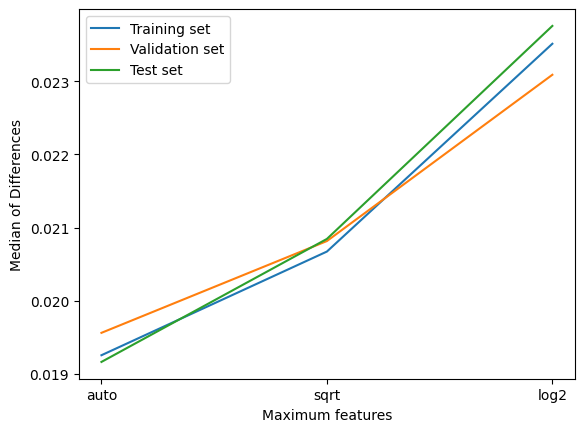

In [149]:
# Plot the results
train_plot = plt.plot(max_features, train_med_diffs, label='Training set')
val_plot = plt.plot(max_features, val_med_diffs, label='Validation set')
test_plot = plt.plot(max_features, test_med_diffs, label='Test set')
plt.xlabel("Maximum features")
plt.ylabel("Median of Differences")
plt.legend()
plt.show()

#### Max features best parameter

In [150]:
MAX_FEATURES = 'auto'

### Random State

In [151]:
def accuracy_by_random_state(train_features, train_targets, val_features, val_targets, test_features, test_targets, random_states): 
  # initialise arrays or lists to store the accuracies for the below loop
  train_accuracy = []
  val_accuracy = []
  test_accuracy = []

  # loop through depths
  for random_state in random_states:
    # initialize model with the maximum depth. 
    dtr = DecisionTreeRegressor(max_depth=DEPTH, min_samples_split=SAMPLE_SPLIT, min_weight_fraction_leaf=LEAF_WEIGHT, min_samples_leaf=LEAF_SAMPLE, max_features=MAX_FEATURES, random_state=random_state)

    # train the model using the training set
    dtr.fit(train_features, train_targets)

    # get the predictions for the training set and calculate their median_diff
    train_predictions = dtr.predict(train_features)
    median_diff_train = median_absolute_error(train_targets, train_predictions)
    train_accuracy.append(median_diff_train)

    # get the predictions for the training set and calculate their median_diff
    val_predictions = dtr.predict(val_features)
    median_diff_val = median_absolute_error(val_targets, val_predictions)
    val_accuracy.append(median_diff_val)

    # get the predictions for the testing set and calculate their median_diff
    predictions = dtr.predict(test_features)
    median_diff_test = median_absolute_error(test_targets, predictions)
    test_accuracy.append(median_diff_test)
        
  # return the accuracies for the training and testing sets
  return train_accuracy, val_accuracy, test_accuracy

In [152]:
random_states = [i for i in range(0, 200, 5)]
train_med_diffs, val_med_diffs, test_med_diffs = accuracy_by_random_state(X_train, y_train, X_val, y_val, X_test, y_test, random_states)
print("Training: Random state with lowest median difference : {}".format(random_states[train_med_diffs.index(min(train_med_diffs))]))
print("Validation: Random state with lowest median difference : {}".format(random_states[val_med_diffs.index(min(val_med_diffs))]))
print("Test: Random state with lowest median difference : {}".format(random_states[test_med_diffs.index(min(test_med_diffs))]))

Training: Random state with lowest median difference : 10
Validation: Random state with lowest median difference : 0
Test: Random state with lowest median difference : 0


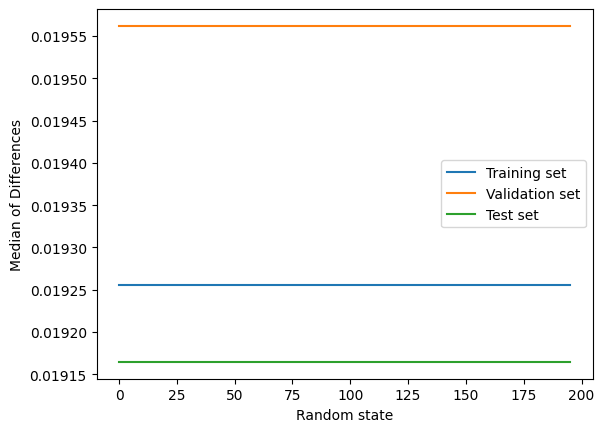

In [153]:
# Plot the results
train_plot = plt.plot(random_states, train_med_diffs, label='Training set')
val_plot = plt.plot(random_states, val_med_diffs, label='Validation set')
test_plot = plt.plot(random_states, test_med_diffs, label='Test set')
plt.xlabel("Random state")
plt.ylabel("Median of Differences")
plt.legend()
plt.show()

#### Best random state param

In [154]:
RANDOM_STATE = 0

### Max leaf_nodes

In [155]:
def accuracy_by_max_leaf(train_features, train_targets, val_features, val_targets, test_features, test_targets, max_leafs): 
  # initialise arrays or lists to store the accuracies for the below loop
  train_accuracy = []
  val_accuracy = []
  test_accuracy = []

  # loop through depths
  for max_leaf in max_leafs:
    # initialize model with the maximum depth. 
    dtr = DecisionTreeRegressor(max_depth=DEPTH, min_samples_split=SAMPLE_SPLIT, min_weight_fraction_leaf=LEAF_WEIGHT, min_samples_leaf=LEAF_SAMPLE, max_features=MAX_FEATURES, random_state=RANDOM_STATE, max_leaf_nodes=max_leaf)

    # train the model using the training set
    dtr.fit(train_features, train_targets)

    # get the predictions for the training set and calculate their median_diff
    train_predictions = dtr.predict(train_features)
    median_diff_train = median_absolute_error(train_targets, train_predictions)
    train_accuracy.append(median_diff_train)

    # get the predictions for the training set and calculate their median_diff
    val_predictions = dtr.predict(val_features)
    median_diff_val = median_absolute_error(val_targets, val_predictions)
    val_accuracy.append(median_diff_val)

    # get the predictions for the testing set and calculate their median_diff
    predictions = dtr.predict(test_features)
    median_diff_test = median_absolute_error(test_targets, predictions)
    test_accuracy.append(median_diff_test)
        
  # return the accuracies for the training and testing sets
  return train_accuracy, val_accuracy, test_accuracy

In [156]:
max_leafs = [i for i in range(2, 30)]
train_med_diffs, val_med_diffs, test_med_diffs = accuracy_by_max_leaf(X_train, y_train, X_val, y_val, X_test, y_test, max_leafs)
print("Training: Max leaf nodes with lowest median difference : {}".format(max_leafs[train_med_diffs.index(min(train_med_diffs))]))
print("Validation: Max leaf nodes with lowest median difference : {}".format(max_leafs[val_med_diffs.index(min(val_med_diffs))]))
print("Test: Max leaf nodes with lowest median difference : {}".format(max_leafs[test_med_diffs.index(min(test_med_diffs))]))

Training: Max leaf nodes with lowest median difference : 8
Validation: Max leaf nodes with lowest median difference : 8
Test: Max leaf nodes with lowest median difference : 8


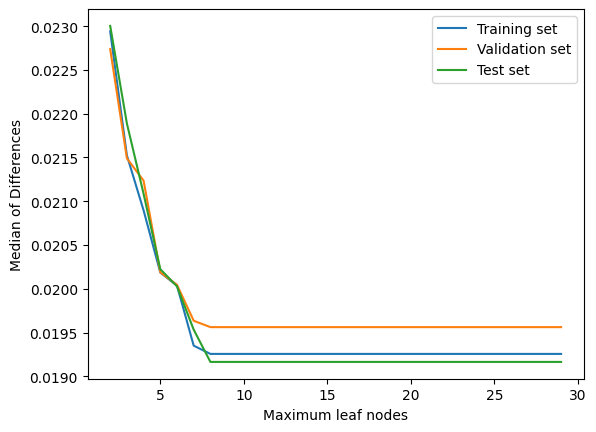

In [157]:
# Plot the results
train_plot = plt.plot(max_leafs, train_med_diffs, label='Training set')
val_plot = plt.plot(max_leafs, val_med_diffs, label='Validation set')
test_plot = plt.plot(max_leafs, test_med_diffs, label='Test set')
plt.xlabel("Maximum leaf nodes")
plt.ylabel("Median of Differences")
plt.legend()
plt.show()

#### Max leaf nodes best param

In [158]:
MAX_LEAF_NODES = 8

### Min impurity decrease

In [159]:
def accuracy_by_min_impurity(train_features, train_targets, val_features, val_targets, test_features, test_targets, min_impurities): 
  # initialise arrays or lists to store the accuracies for the below loop
  train_accuracy = []
  val_accuracy = []
  test_accuracy = []

  # loop through depths
  for min_impurity in min_impurities:
    # initialize model with the maximum depth. 
    dtr = DecisionTreeRegressor(max_depth=DEPTH, min_samples_split=SAMPLE_SPLIT, min_weight_fraction_leaf=LEAF_WEIGHT, min_samples_leaf=LEAF_SAMPLE, max_features=MAX_FEATURES, random_state=RANDOM_STATE, max_leaf_nodes=MAX_LEAF_NODES, min_impurity_decrease=min_impurity)

    # train the model using the training set
    dtr.fit(train_features, train_targets)

    # get the predictions for the training set and calculate their median_diff
    train_predictions = dtr.predict(train_features)
    median_diff_train = median_absolute_error(train_targets, train_predictions)
    train_accuracy.append(median_diff_train)

    # get the predictions for the training set and calculate their median_diff
    val_predictions = dtr.predict(val_features)
    median_diff_val = median_absolute_error(val_targets, val_predictions)
    val_accuracy.append(median_diff_val)

    # get the predictions for the testing set and calculate their median_diff
    predictions = dtr.predict(test_features)
    median_diff_test = median_absolute_error(test_targets, predictions)
    test_accuracy.append(median_diff_test)
        
  # return the accuracies for the training and testing sets
  return train_accuracy, val_accuracy, test_accuracy

In [160]:
impurities = [i * 0.1 for i in range(0, 10)]
train_med_diffs, val_med_diffs, test_med_diffs = accuracy_by_min_impurity(X_train, y_train, X_val, y_val, X_test, y_test, impurities)
print("Training: Minimum impurity decrease with lowest median difference : {}".format(impurities[train_med_diffs.index(min(train_med_diffs))]))
print("Validation: Minimum impurity decrease with lowest median difference : {}".format(impurities[val_med_diffs.index(min(val_med_diffs))]))
print("Test: Minimum impurity decrease with lowest median difference : {}".format(impurities[test_med_diffs.index(min(test_med_diffs))]))

Training: Minimum impurity decrease with lowest median difference : 0.0
Validation: Minimum impurity decrease with lowest median difference : 0.0
Test: Minimum impurity decrease with lowest median difference : 0.0


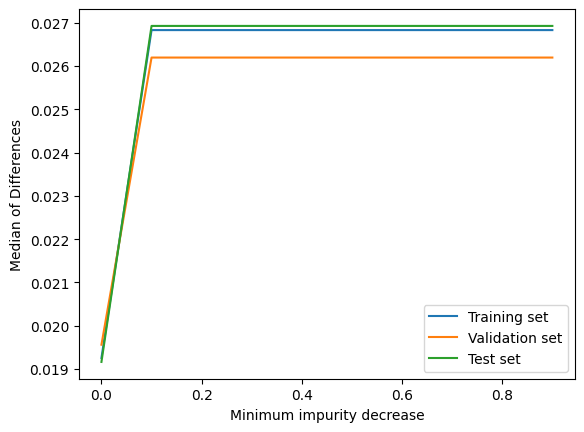

In [161]:
# Plot the results
train_plot = plt.plot(impurities, train_med_diffs, label='Training set')
val_plot = plt.plot(impurities, val_med_diffs, label='Validation set')
test_plot = plt.plot(impurities, test_med_diffs, label='Test set')
plt.xlabel("Minimum impurity decrease")
plt.ylabel("Median of Differences")
plt.legend()
plt.show()

#### Min impurities best param

In [162]:
MIN_IMPURITY = 0.0

### CCP Alpha

In [163]:
def accuracy_by_ccp_alpha(train_features, train_targets, val_features, val_targets, test_features, test_targets, alphas): 
  # initialise arrays or lists to store the accuracies for the below loop
  train_accuracy = []
  val_accuracy = []
  test_accuracy = []

  # loop through depths
  for alpha in alphas:
    # initialize model with the maximum depth. 
    dtr = DecisionTreeRegressor(max_depth=DEPTH, min_samples_split=SAMPLE_SPLIT, min_weight_fraction_leaf=LEAF_WEIGHT, min_samples_leaf=LEAF_SAMPLE, max_features=MAX_FEATURES, random_state=RANDOM_STATE, max_leaf_nodes=MAX_LEAF_NODES, min_impurity_decrease=MIN_IMPURITY, ccp_alpha=alpha)

    # train the model using the training set
    dtr.fit(train_features, train_targets)

    # get the predictions for the training set and calculate their median_diff
    train_predictions = dtr.predict(train_features)
    median_diff_train = median_absolute_error(train_targets, train_predictions)
    train_accuracy.append(median_diff_train)

    # get the predictions for the training set and calculate their median_diff
    val_predictions = dtr.predict(val_features)
    median_diff_val = median_absolute_error(val_targets, val_predictions)
    val_accuracy.append(median_diff_val)

    # get the predictions for the testing set and calculate their median_diff
    predictions = dtr.predict(test_features)
    median_diff_test = median_absolute_error(test_targets, predictions)
    test_accuracy.append(median_diff_test)
        
  # return the accuracies for the training and testing sets
  return train_accuracy, val_accuracy, test_accuracy

In [164]:
alphas = [i * 0.1 for i in range(0, 10)]
train_med_diffs, val_med_diffs, test_med_diffs = accuracy_by_ccp_alpha(X_train, y_train, X_val, y_val, X_test, y_test, alphas)
print("Training: CCP Alpha with lowest median difference : {}".format(alphas[train_med_diffs.index(min(train_med_diffs))]))
print("Validation: CCP Alpha with lowest median difference : {}".format(alphas[val_med_diffs.index(min(val_med_diffs))]))
print("Test: CCP Alpha with lowest median difference : {}".format(alphas[test_med_diffs.index(min(test_med_diffs))]))

Training: CCP Alpha with lowest median difference : 0.0
Validation: CCP Alpha with lowest median difference : 0.0
Test: CCP Alpha with lowest median difference : 0.0


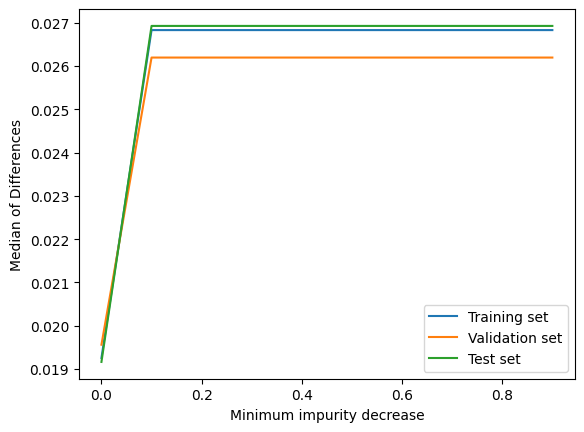

In [165]:
# Plot the results
train_plot = plt.plot(alphas, train_med_diffs, label='Training set')
val_plot = plt.plot(alphas, val_med_diffs, label='Validation set')
test_plot = plt.plot(alphas, test_med_diffs, label='Test set')
plt.xlabel("Minimum impurity decrease")
plt.ylabel("Median of Differences")
plt.legend()
plt.show()

#### ccp alpha best parameter

In [166]:
CCP_ALPHA = 0.0

## Create model with best hyperparameter

DEPTH = 10

SAMPLE_SPLIT = 4

LEAF_WEIGHT = 0.1

LEAF_SAMPLE = 1

MAX_FEATURES = "auto"

RANDOM_STATE = 0

MAX_LEAF_NODES = 8

MIN_IMPURITY = 0.0

CCP_ALPHA = 0.0

In [167]:
tuned_dtr = DecisionTreeRegressor(
    max_depth=DEPTH, 
    min_samples_split=SAMPLE_SPLIT, 
    min_weight_fraction_leaf=LEAF_WEIGHT, 
    max_features=MAX_FEATURES, 
    random_state=RANDOM_STATE, 
    max_leaf_nodes=MAX_LEAF_NODES,
    min_impurity_decrease=MIN_IMPURITY,
    ccp_alpha=CCP_ALPHA)

### Train

In [168]:
tuned_dtr.fit(X_train, y_train)

score = tuned_dtr.score(X_train, y_train)

# Prediction on the training dataset
y_train_pred = tuned_dtr.predict(X_train)

mse = mean_squared_error(y_train, y_train_pred)
mae = mean_absolute_error(y_train, y_train_pred)
evs = explained_variance_score(y_train, y_train_pred)
meae = median_absolute_error(y_train, y_train_pred)

print(f"R-squared: {score}")
print(f"Mean Absolute Error: {mae.round(2)}")
print(f"Mean Squared Error: {mse.round(2)}")
print(f"RMSE: {np.square(mse).round(2)}")
print(f"EVS: {evs.round(2)}")
print(f"Median Absolute Error: {meae.round(2)}")

R-squared: 0.3293438978709956
Mean Absolute Error: 0.02
Mean Squared Error: 0.0
RMSE: 0.0
EVS: 0.33
Median Absolute Error: 0.02


### Evaluation

In [169]:
y_val_pred = tuned_dtr.predict(X_val)

rScore = r2_score(y_val, y_val_pred)
mse = mean_squared_error(y_val, y_val_pred)
mae = mean_absolute_error(y_val, y_val_pred)
evs = explained_variance_score(y_val, y_val_pred)
meae = median_absolute_error(y_val, y_val_pred)

print(f"R-squared: {rScore}")
print(f"Mean Absolute Error: {mae.round(2)}")
print(f"Mean Squared Error: {mse.round(2)}")
print(f"RMSE: {np.square(mse).round(2)}")
print(f"EVS: {evs.round(2)}")
print(f"Median Absolute Error: {meae.round(4)}")

R-squared: 0.329099156869059
Mean Absolute Error: 0.02
Mean Squared Error: 0.0
RMSE: 0.0
EVS: 0.33
Median Absolute Error: 0.0196


In [170]:
y_pred = tuned_dtr.predict(X_test)

rScore = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
evs = explained_variance_score(y_test, y_pred)
meae = median_absolute_error(y_test, y_pred)

print(f"R-squared: {rScore}")
print(f"Mean Absolute Error: {mae.round(2)}")
print(f"Mean Squared Error: {mse.round(2)}")
print(f"RMSE: {np.square(mse).round(2)}")
print(f"EVS: {evs.round(2)}")
print(f"Median Absolute Error: {meae.round(4)}")

R-squared: 0.3382020991028085
Mean Absolute Error: 0.02
Mean Squared Error: 0.0
RMSE: 0.0
EVS: 0.34
Median Absolute Error: 0.0192


### Plot

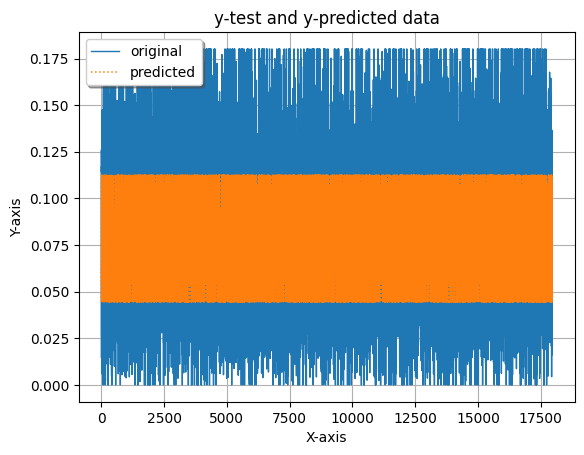

In [171]:
x_ax = range(len(y_test))
fig = plt.figure()
plt.plot(x_ax, y_test, linewidth=1, label="original", linestyle='-')
plt.plot(x_ax, y_pred, linewidth=1.1, label="predicted", linestyle=':')
plt.title("y-test and y-predicted data")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
# plt

In [172]:
data = y_test-y_pred

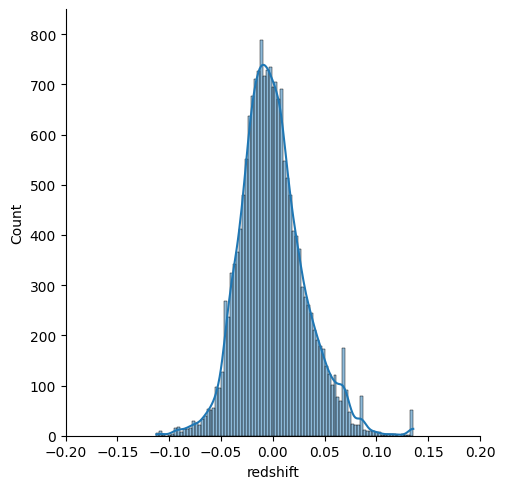

In [174]:
# checking difference between labled y and predicted y
g = sns.displot(data, kind='hist', kde=True)
g.set(ylim=(0, 850), xlim=(-0.2, 0.2))

## Plotting prediction errors and residuals using yellowbrick


In [175]:
!pip install yellowbrick

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [176]:
from yellowbrick.regressor import PredictionError

### Initial DTR model

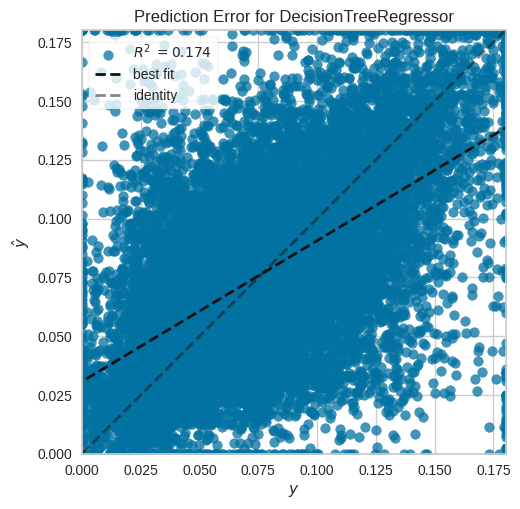

<Axes: title={'center': 'Prediction Error for DecisionTreeRegressor'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [177]:
visualizer = PredictionError(dtr)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof()

In [178]:
# Residuals plot
from yellowbrick.regressor import ResidualsPlot

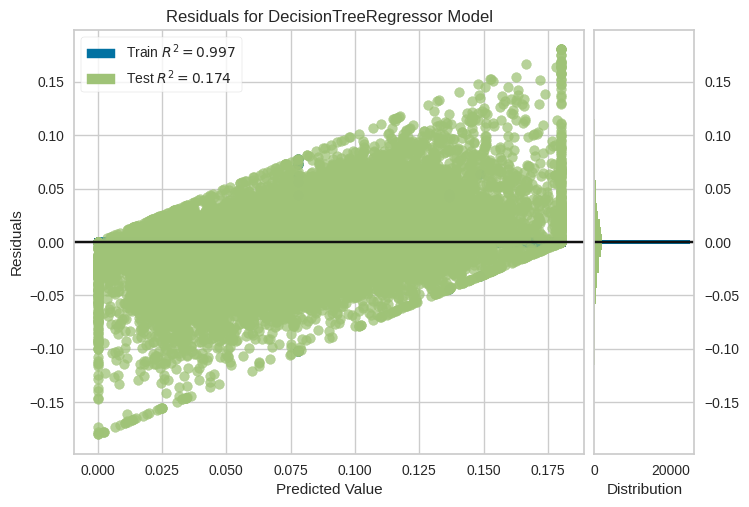

<Axes: title={'center': 'Residuals for DecisionTreeRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [179]:
visualizer = ResidualsPlot(dtr)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof()

In [180]:
# Testing model evaluation
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
evs = explained_variance_score(y_test, y_pred)
meae = median_absolute_error(y_test, y_pred)

print(f"Mean Absolute Error: {mae.round(2)}")
print(f"Mean Squared Error: {mse.round(2)}")
print(f"RMSE: {np.square(mse).round(2)}")
print(f"EVS: {evs.round(2)}")
print(f"Median Absolute Error: {meae.round(2)}")

Mean Absolute Error: 0.02
Mean Squared Error: 0.0
RMSE: 0.0
EVS: 0.34
Median Absolute Error: 0.02


### Hyperparameter tuned model

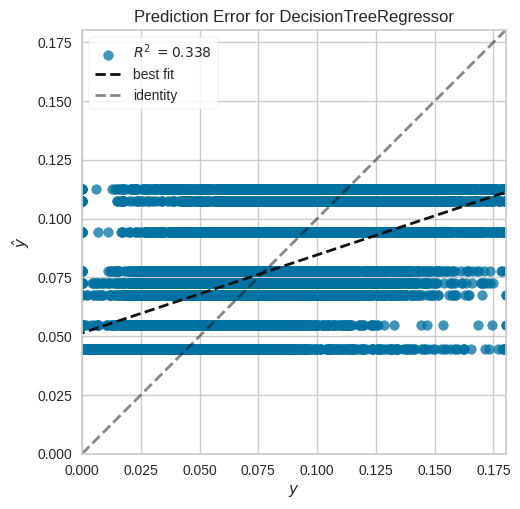

<Axes: title={'center': 'Prediction Error for DecisionTreeRegressor'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [181]:
visualizer = PredictionError(tuned_dtr)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof()

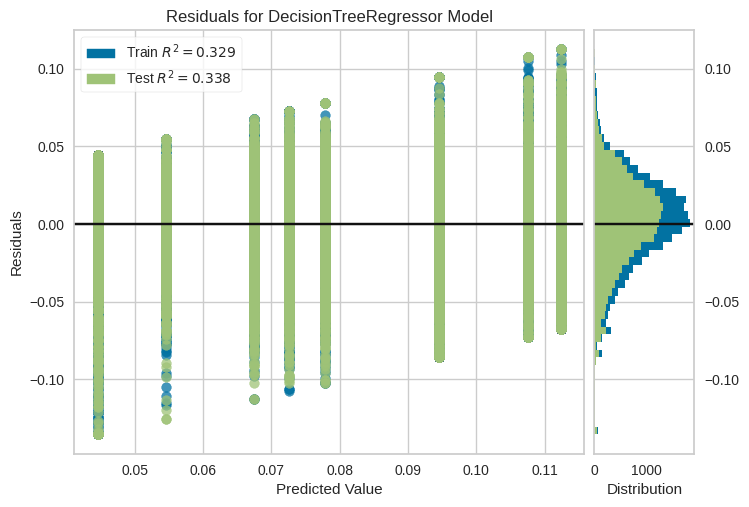

<Axes: title={'center': 'Residuals for DecisionTreeRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [182]:
visualizer = ResidualsPlot(tuned_dtr)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof()

In [183]:
# Testing model evaluation
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
evs = explained_variance_score(y_test, y_pred)
meae = median_absolute_error(y_test, y_pred)

print(f"Mean Absolute Error: {mae.round(2)}")
print(f"Mean Squared Error: {mse.round(2)}")
print(f"RMSE: {np.square(mse).round(2)}")
print(f"EVS: {evs.round(2)}")
print(f"Median Absolute Error: {meae.round(2)}")

Mean Absolute Error: 0.02
Mean Squared Error: 0.0
RMSE: 0.0
EVS: 0.34
Median Absolute Error: 0.02


## k-fold cross-validation

In [184]:
from sklearn.model_selection import cross_validate, cross_val_score

In [185]:
import sklearn.metrics

In [186]:
sklearn.metrics.get_scorer_names()

['accuracy',
 'adjusted_mutual_info_score',
 'adjusted_rand_score',
 'average_precision',
 'balanced_accuracy',
 'completeness_score',
 'explained_variance',
 'f1',
 'f1_macro',
 'f1_micro',
 'f1_samples',
 'f1_weighted',
 'fowlkes_mallows_score',
 'homogeneity_score',
 'jaccard',
 'jaccard_macro',
 'jaccard_micro',
 'jaccard_samples',
 'jaccard_weighted',
 'matthews_corrcoef',
 'max_error',
 'mutual_info_score',
 'neg_brier_score',
 'neg_log_loss',
 'neg_mean_absolute_error',
 'neg_mean_absolute_percentage_error',
 'neg_mean_gamma_deviance',
 'neg_mean_poisson_deviance',
 'neg_mean_squared_error',
 'neg_mean_squared_log_error',
 'neg_median_absolute_error',
 'neg_negative_likelihood_ratio',
 'neg_root_mean_squared_error',
 'normalized_mutual_info_score',
 'positive_likelihood_ratio',
 'precision',
 'precision_macro',
 'precision_micro',
 'precision_samples',
 'precision_weighted',
 'r2',
 'rand_score',
 'recall',
 'recall_macro',
 'recall_micro',
 'recall_samples',
 'recall_weighted',

In [187]:
def cross_validate_model(model, features, targets, k):
  # initialise a list of scoring
  scoring = ['r2', 'neg_mean_squared_error', 'neg_root_mean_squared_error', 'neg_median_absolute_error']
  results = cross_validate(model, features, targets, cv=k, scoring=scoring, return_train_score=True)

  # return the list with your median difference values
  return {
      "Training r2 scores": results['train_r2'],
      "Training mean r2 scores": results['train_r2'].mean(),
      "Training neg mean squared error scores": results['train_neg_mean_squared_error'],
      "Training mean neg mean squared error scores": results['train_neg_mean_squared_error'].mean(),
      "Training neg root mean squared error scores": results['train_neg_root_mean_squared_error'],
      "Training mean neg root mean squared error scores": results['train_neg_root_mean_squared_error'].mean(),
      "Training neg median absolute error scores": results['train_neg_median_absolute_error'],
      "Training mean neg median absolute error scores": results['train_neg_median_absolute_error'].mean(),
      "Training mean median absolute error scores": results['train_neg_median_absolute_error'].mean() * -1,
      "Test r2 scores": results['test_r2'],
      "Test mean r2 scores": results['test_r2'].mean(),
      "Test neg mean squared error scores": results['test_neg_mean_squared_error'],
      "Test mean neg mean squared error scores": results['test_neg_mean_squared_error'].mean(),
      "Test neg root mean squared error scores": results['test_neg_root_mean_squared_error'],
      "Test mean neg root mean squared error scores": results['test_neg_root_mean_squared_error'].mean(),
      "Test neg median absolute error scores": results['test_neg_median_absolute_error'],
      "Test mean neg median absolute error scores": results['test_neg_median_absolute_error'].mean(),
      "Test mean median absolute error scores": results['test_neg_median_absolute_error'].mean() * -1,
  }

In [188]:
result = cross_validate_model(tuned_dtr, galaxy_features, galaxy_target, 5)
print("{")
for key in result:
    print('  ',key, ': ', result[key])
print("}")

{
   Training r2 scores :  [0.32598295 0.33563699 0.33832155 0.32706037 0.31579451]
   Training mean r2 scores :  0.3285592749687065
   Training neg mean squared error scores :  [-0.00099958 -0.00098725 -0.00098633 -0.00100092 -0.00102156]
   Training mean neg mean squared error scores :  -0.0009991277179722494
   Training neg root mean squared error scores :  [-0.03161607 -0.03142059 -0.03140588 -0.03163737 -0.0319618 ]
   Training mean neg root mean squared error scores :  -0.03160834228317679
   Training neg median absolute error scores :  [-0.01932214 -0.0191519  -0.01942057 -0.0195796  -0.01985587]
   Training mean neg median absolute error scores :  -0.019466016884773476
   Training mean median absolute error scores :  0.019466016884773476
   Test r2 scores :  [0.31862807 0.34401762 0.31981339 0.31019812 0.32707508]
   Test mean r2 scores :  0.3239464575267004
   Test neg mean squared error scores :  [-0.00102741 -0.00098086 -0.001005   -0.00102814 -0.00098779]
   Test mean neg m

In [189]:
def plot_result(x_label, y_label, plot_title, train_data, val_data):
        '''Function to plot a grouped bar chart showing the training and validation
          results of the ML model in each fold after applying K-fold cross-validation.
         Parameters
         ----------
         x_label: str, 
            Name of the algorithm used for training e.g 'Decision Tree'
          
         y_label: str, 
            Name of metric being visualized e.g 'Accuracy'
         plot_title: str, 
            This is the title of the plot e.g 'Accuracy Plot'
         
         train_result: list, array
            This is the list containing either training precision, accuracy, or f1 score.
        
         val_result: list, array
            This is the list containing either validation precision, accuracy, or f1 score.
         Returns
         -------
         The function returns a Grouped Barchart showing the training and validation result
         in each fold.
        '''
        
        # Set size of plot
        plt.figure(figsize=(12,6))
        labels = ["1st Fold", "2nd Fold", "3rd Fold", "4th Fold", "5th Fold"]
        X_axis = np.arange(len(labels))
        ax = plt.gca()
        plt.ylim(0, 0.2)
        plt.bar(X_axis-0.2, train_data, 0.4, color='blue', label='Training')
        plt.bar(X_axis+0.2, val_data, 0.4, color='red', label='Validation')
        plt.title(plot_title, fontsize=30)
        plt.xticks(X_axis, labels)
        plt.xlabel(x_label, fontsize=14)
        plt.ylabel(y_label, fontsize=14)
        plt.legend()
        plt.grid(True)
        plt.show()

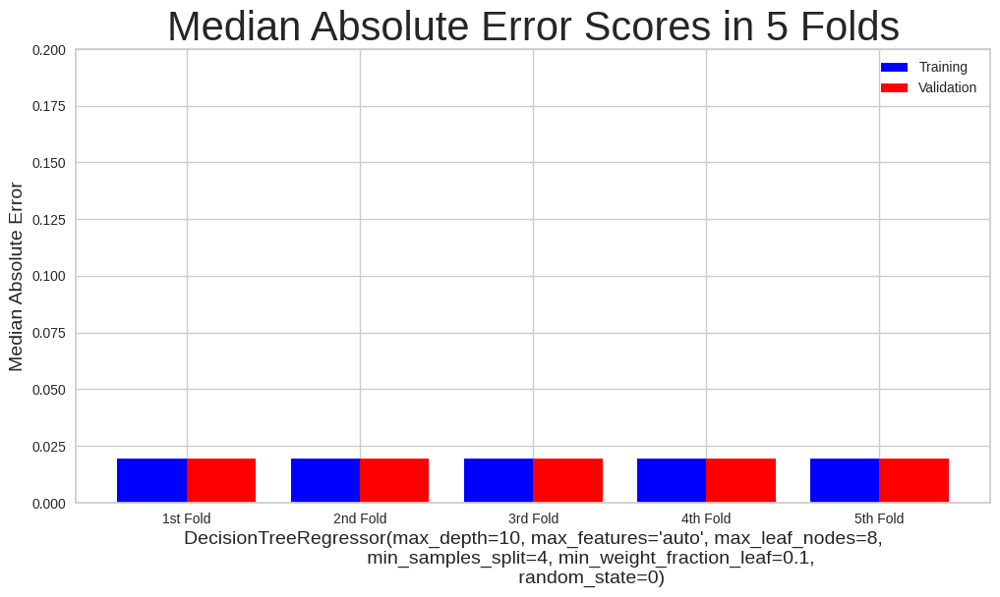

In [190]:
model_name = "Decision Tree"
plot_result(tuned_dtr,
            "Median Absolute Error",
            "Median Absolute Error Scores in 5 Folds",
            result["Training mean median absolute error scores"],
            result["Test mean median absolute error scores"])

In [201]:
# Score on training data set
score_train = cross_val_score(tuned_dtr, X_train, y_train, scoring='neg_mean_absolute_error', cv=20)

In [202]:
score_train

array([-0.02422127, -0.02358883, -0.02418561, -0.02383222, -0.02413614,
       -0.02402084, -0.0243805 , -0.02498284, -0.024553  , -0.02388099,
       -0.0246161 , -0.02463512, -0.02447333, -0.02409653, -0.02351211,
       -0.02506039, -0.02467516, -0.0245611 , -0.0254243 , -0.02531619])

In [203]:
score_train = np.absolute(np.mean(score_train)).round(4)
score_train

0.0244

In [204]:
# Score on test data set
score_test = cross_val_score(tuned_dtr, X_test, y_test, scoring='neg_median_absolute_error', cv=20)

In [205]:
score_test

array([-0.0191723 , -0.0196507 , -0.01819056, -0.02008726, -0.01950209,
       -0.01843787, -0.01915222, -0.0209071 , -0.02047406, -0.02043523,
       -0.02042396, -0.02008752, -0.01952035, -0.01956927, -0.01920126,
       -0.02041715, -0.01919118, -0.02045029, -0.02230245, -0.02022916])

In [206]:
score_test = np.absolute(np.mean(score_test)).round(5)
score_test

0.01987

## Export Machine Learning Model to pickle file to create API

In [207]:
import pickle

In [208]:
pickle.dump(tuned_dtr, open('DTRmodel.pkl', 'wb'))

In [209]:
model = pickle.load(open('DTRmodel.pkl', 'rb'))
model.predict(X_test)

array([0.0445768 , 0.05460907, 0.07260198, ..., 0.0445768 , 0.09451211,
       0.07260198])